<a href="https://colab.research.google.com/github/XiziLiu-illulli/test/blob/main/Week6_assignment_22013685.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creating Training Data from Aligned and Misaligned Imagery

In this section, we illustrate a **three-step** approach to co-registering **Sentinel-3 (S3)** and **Sentinel-2 (S2)** data on a sub-subarea:

1. **Scenario 1 (Cell 1): Artificial Misalignment**  
   We **manually shift** the S3 dataset by a chosen \((\Delta x,\Delta y)\) in real-world coordinates. This simulates misalignment for testing and creates a “no alignment” baseline dataset.

2. **Scenario 2 (Cell 2): Finding the Optimal Shift with ECC**  
   We **interpolate** both S2 and (misaligned) S3 reflectance onto a 2D grid and run **OpenCV’s ECC** algorithm. This recovers the translation needed to re-align S3 onto S2, shown in a plot with arrows indicating the artificial shift and the ECC-recovered shift.

3. **Scenario 3 (Cell 3): Applying the Shift**  
   Finally, we **apply** the ECC-derived shift to the **raw** (x, y) S3 coordinates and re-build the co-located dataset. This produces a new “aligned” dataset for downstream tasks (e.g., training a model with S3 inputs and S2-derived Melt Pond Fraction targets).


By the end, you’ll have **two training datasets**—one misaligned and one aligned—allowing you to **test** how sea ice drifting and correction impact your results.

## Scenario 1: Creating a Training Dataset with Manual Misalignment

In this cell, we:

1. **Load** the pre-filtered Sentinel-2 (S2), Sentinel-3 (S3), and Melt Pond Fraction (MPF) data.
2. **Manually apply** a fixed \((\Delta x, \Delta y)\) shift to **S3** coordinates to simulate misalignment over the chosen sub-subarea.
3. **Visualise** original versus misaligned data, showing how S3 points have shifted in space.
4. **Use KDTree** to associate each S2 pixel with its nearest (misaligned) S3 pixel.
5. **Average** MPF values for each misaligned S3 location, producing an MPF map on S3’s shifted grid.
6. **Save** the resulting “no alignment” (actually artificially misaligned) training dataset for later comparison.

This provides a **baseline scenario** where S3 is deliberately offset from S2, enabling us to see how alignment corrections in subsequent cells improve or change the final training data.

The MPF data (generated using the algorithm from
[https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2022GL102102](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2022GL102102))


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Manually misaligning S3 by dx=1500, dy=-1500
S2 points in sub-subarea: 1002001
Original S3 points in sub-subarea: 5067
Misaligned S3 points in sub-subarea: 5057


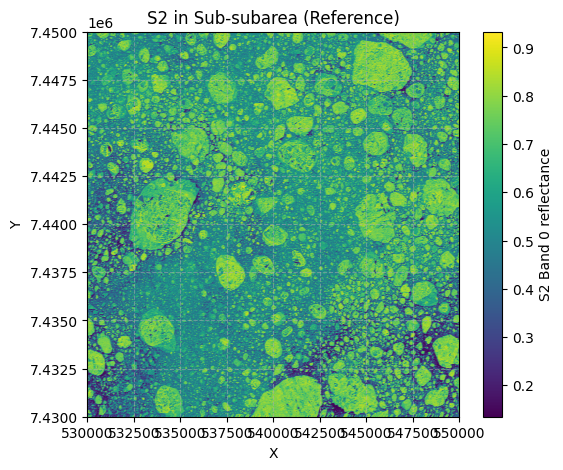

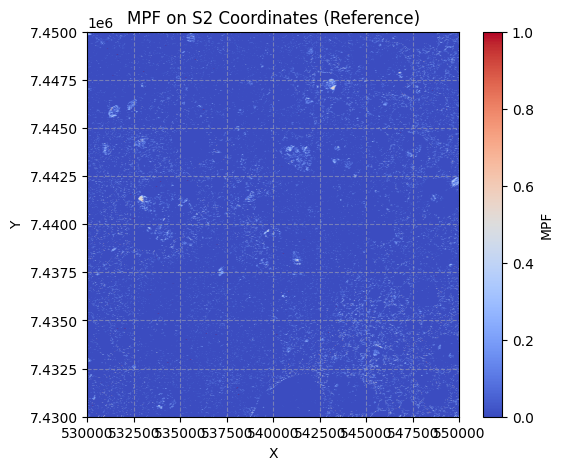

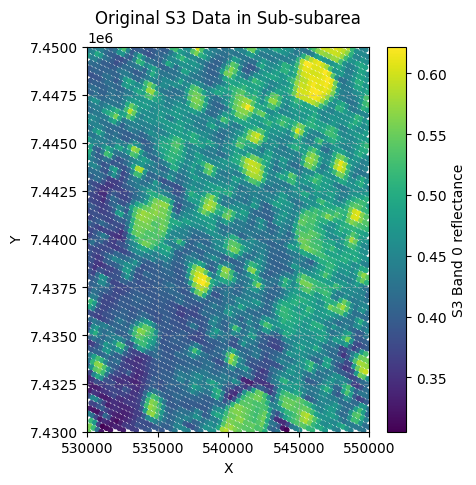

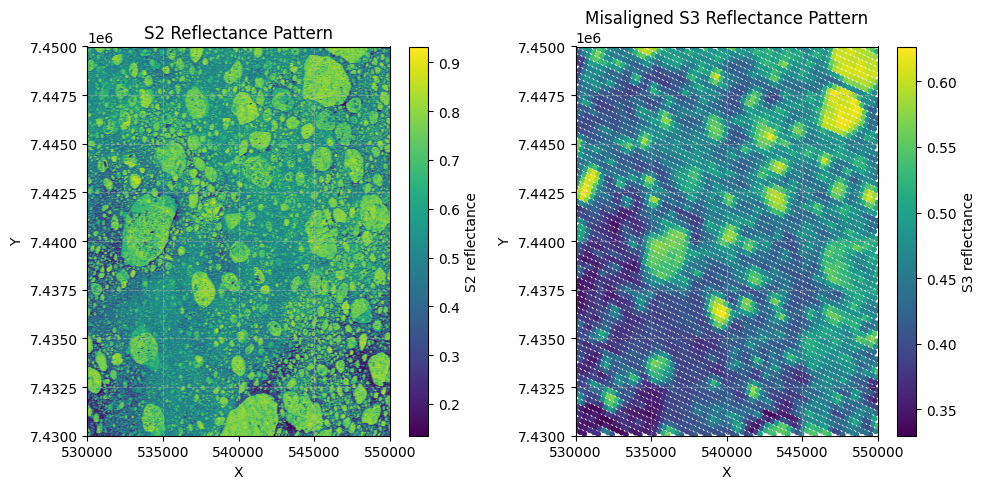

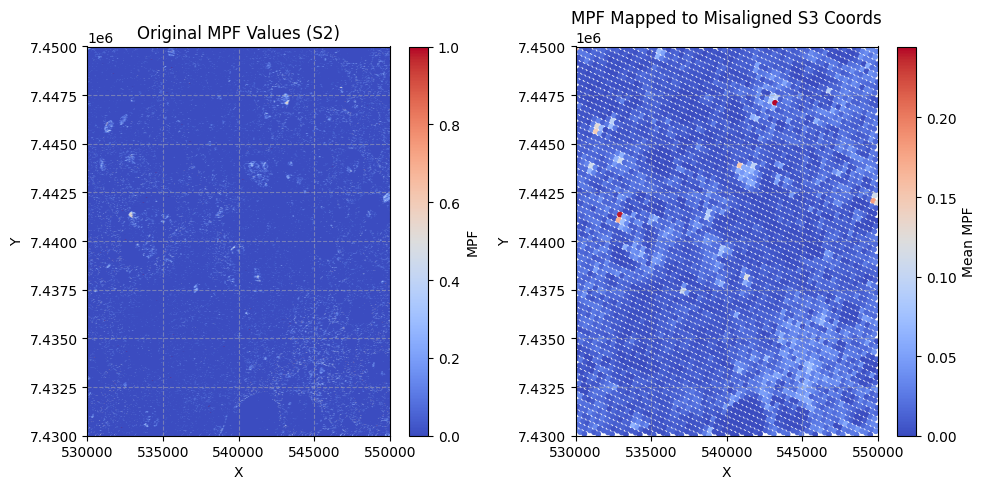

Scenario 1 done. Training dataset (with MANUAL MISALIGNMENT) saved.


In [4]:
# SCENARIO 1: CREATE A TRAINING DATASET WITH MANUAL MISALIGNMENT
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree
from collections import defaultdict

# 1) Load zoomed S2, S3, MPF data
save_path = '/content/drive/MyDrive/GEOL0069/Week 6/'
s2_data = np.load(save_path + '/Week_6_Part_2/s2_zoomed_data.npz')
s3_data = np.load(save_path + '/Week_6_Part_2/s3_zoomed_data.npz')
mpf_data = np.load(save_path + '/Week_6_Part_2/mpf_zoomed_data.npz')

# 2) Extract arrays - use FULL datasets before filtering
s2_x_all, s2_y_all = s2_data['x'], s2_data['y']
band_s2_all = s2_data['band_data']
mpf_all = mpf_data['mpf']
s3_x_all, s3_y_all = s3_data['x'], s3_data['y']
band_s3_all = s3_data['reflectance']

# 3) Define sub-subarea bounds
sub_x_min, sub_x_max = 530000.0, 550000.0
sub_y_min, sub_y_max = 7430000.0, 7450000.0

# 4) MANUALLY INTRODUCE MISALIGNMENT
manual_dx, manual_dy = 1500, -1500
print(f"Manually misaligning S3 by dx={manual_dx}, dy={manual_dy}")

# 5) Apply misalignment to FULL S3 dataset
s3_x_misaligned_all = s3_x_all + manual_dx
s3_y_misaligned_all = s3_y_all + manual_dy

# 6) Filter S2 & MPF for sub-subarea
cond_s2_sub = (
    (s2_x_all >= sub_x_min) & (s2_x_all <= sub_x_max) &
    (s2_y_all >= sub_y_min) & (s2_y_all <= sub_y_max)
)
s2_x = s2_x_all[cond_s2_sub]
s2_y = s2_y_all[cond_s2_sub]
band_s2 = band_s2_all[cond_s2_sub]
mpf_vals = mpf_all[cond_s2_sub]

# 7) Filter original S3 for sub-subarea
cond_s3_original_sub = (
    (s3_x_all >= sub_x_min) & (s3_x_all <= sub_x_max) &
    (s3_y_all >= sub_y_min) & (s3_y_all <= sub_y_max)
)
s3_x_original = s3_x_all[cond_s3_original_sub]
s3_y_original = s3_y_all[cond_s3_original_sub]
band_s3_original = band_s3_all[cond_s3_original_sub]

# 8) Filter MISALIGNED S3 for sub-subarea - this includes NEW data that shifted into the area
cond_s3_misaligned_sub = (
    (s3_x_misaligned_all >= sub_x_min) & (s3_x_misaligned_all <= sub_x_max) &
    (s3_y_misaligned_all >= sub_y_min) & (s3_y_misaligned_all <= sub_y_max)
)
s3_x_misaligned = s3_x_misaligned_all[cond_s3_misaligned_sub]
s3_y_misaligned = s3_y_misaligned_all[cond_s3_misaligned_sub]
band_s3_misaligned = band_s3_all[cond_s3_misaligned_sub]

print(f"S2 points in sub-subarea: {len(s2_x)}")
print(f"Original S3 points in sub-subarea: {len(s3_x_original)}")
print(f"Misaligned S3 points in sub-subarea: {len(s3_x_misaligned)}")

# 9) Visualise S2 and MPF (reference data)
plt.figure(figsize=(6,5))
plt.scatter(s2_x, s2_y, c=band_s2[:, 0]/10000.0, cmap='viridis', s=1)
plt.colorbar(label='S2 Band 0 reflectance')
plt.title('S2 in Sub-subarea (Reference)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.show()

plt.figure(figsize=(6,5))
plt.scatter(s2_x, s2_y, c=mpf_vals, cmap='coolwarm', s=1)
plt.colorbar(label='MPF')
plt.title('MPF on S2 Coordinates (Reference)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.show()

# 10) Visualise original vs. misaligned S3 in the sub-subarea
plt.figure(figsize=(10,5))

# Original S3
plt.subplot(1, 2, 1)
plt.scatter(s3_x_original, s3_y_original, c=band_s3_original[:, 0], cmap='viridis', s=10)
plt.colorbar(label='S3 Band 0 reflectance')
plt.title('Original S3 Data in Sub-subarea')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)


# 11) Visualise difference in reflectance patterns
# Create a figure showing the misaligned S3 data next to S2 data
plt.figure(figsize=(10,5))

# S2 reflectance
plt.subplot(1, 2, 1)
plt.scatter(s2_x, s2_y, c=band_s2[:, 0]/10000.0, cmap='viridis', s=3)
plt.colorbar(label='S2 reflectance')
plt.title('S2 Reflectance Pattern')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)

# Misaligned S3 reflectance
plt.subplot(1, 2, 2)
plt.scatter(s3_x_misaligned, s3_y_misaligned, c=band_s3_misaligned[:, 0], cmap='viridis', s=10)
plt.colorbar(label='S3 reflectance')
plt.title('Misaligned S3 Reflectance Pattern')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)

plt.tight_layout()
plt.show()

# 12) Use KDTree to associate S2 -> misaligned S3
s2_points = np.vstack((s2_x, s2_y)).T
s3_points_misaligned = np.vstack((s3_x_misaligned, s3_y_misaligned)).T
tree = KDTree(s3_points_misaligned)

# Find nearest S3 point for each S2 point
distances, s3_idx_for_s2 = tree.query(s2_points)


# 13) Group S2 indices by S3 index
grouped = defaultdict(list)
for s2_idx, s3_idx in enumerate(s3_idx_for_s2):
    grouped[s3_idx].append(s2_idx)

# 14) Compute mean MPF for each S3 pixel
mpf_avg = np.full(len(s3_points_misaligned), np.nan)
for s3_i, s2_list in grouped.items():
    mpf_for_this_s3 = mpf_vals[s2_list]
    if np.any(~np.isnan(mpf_for_this_s3)):
        mpf_avg[s3_i] = np.nanmean(mpf_for_this_s3)

# 15) Remove NaNs
valid_s3 = ~np.isnan(mpf_avg)
s3_x_clean = s3_x_misaligned[valid_s3]
s3_y_clean = s3_y_misaligned[valid_s3]
band_s3_clean = band_s3_misaligned[valid_s3]
mpf_clean = mpf_avg[valid_s3]

# 16) Plot the S3-located MPF distribution
plt.figure(figsize=(10,5))

# S2 MPF (Original reference)
plt.subplot(1, 2, 1)
plt.scatter(s2_x, s2_y, c=mpf_vals, cmap='coolwarm', s=3)
plt.colorbar(label='MPF')
plt.title('Original MPF Values (S2)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)

# S3-derived MPF
plt.subplot(1, 2, 2)
plt.scatter(s3_x_clean, s3_y_clean, c=mpf_clean, cmap='coolwarm', s=10)
plt.colorbar(label='Mean MPF')
plt.title('MPF Mapped to Misaligned S3 Coords')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)

plt.tight_layout()
plt.show()

# 17) Save dataset
training_data_noalign = {
    "s3_x": s3_x_clean,
    "s3_y": s3_y_clean,
    "s3_features": band_s3_clean,
    "mpf_target": mpf_clean,
    "manual_misalignment": np.array([manual_dx, manual_dy])  # Save the misalignment values
}
np.savez(save_path + '/training_data_subsubarea_noalign.npz', **training_data_noalign)
print("Scenario 1 done. Training dataset (with MANUAL MISALIGNMENT) saved.")

## Cell 2: Detecting and Visualizing the Shift with ECC

In this cell, we:

1. **Load** the sub-subarea data (both S2 and artificially misaligned S3).
2. **Interpolate** each dataset onto a regular 2D grid (e.g., 300×300 pixels) for image-based alignment.
3. **Use OpenCV’s ECC** (`findTransformECC`) to estimate the translational offset between the S2 and misaligned S3 grids.
4. **Convert** the detected pixel shift into **real-world coordinates** using the bounding-box dimensions.
5. **Visualise**:
   - The interpolated grids (S2 vs. misaligned S3)  
   - The ECC-realigned S3 grid  
   - Arrows illustrating the recovered shift  


This process provides a **quantitative measure** of the offset, confirming how well ECC recovers our manual misalignment. You’ll also see how to **interpret** pixel-based shifts in **meter** terms.  

It’s important to note that ECC has practical limits on how large a misalignment it can recover. If the manual shift is too large, ECC may fail to converge and won’t successfully realign the data.

Loaded manual misalignment: dx=1500, dy=-1500
S2 sub-subarea points: 1002001
Misaligned S3 sub-subarea points: 5057


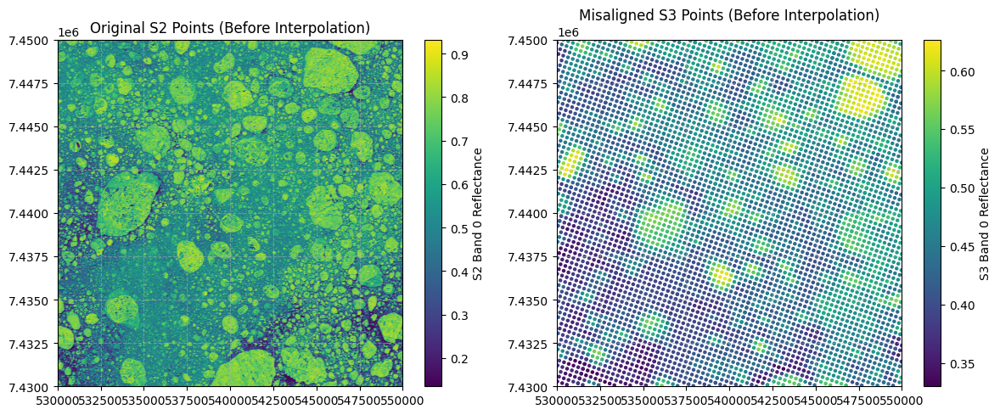

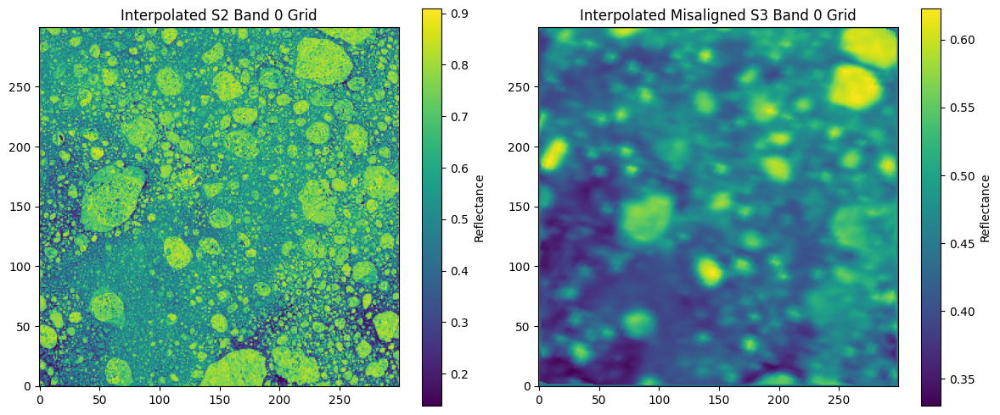

[ECC] Detected misalignment: dx=-28.68, dy=18.35, CC=0.6686
Known manual misalignment: dx=1500, dy=-1500
Correction should be approx: dx=-1500, dy=1500
ECC detected shift in real coordinates: dx=-1911.78, dy=1223.38


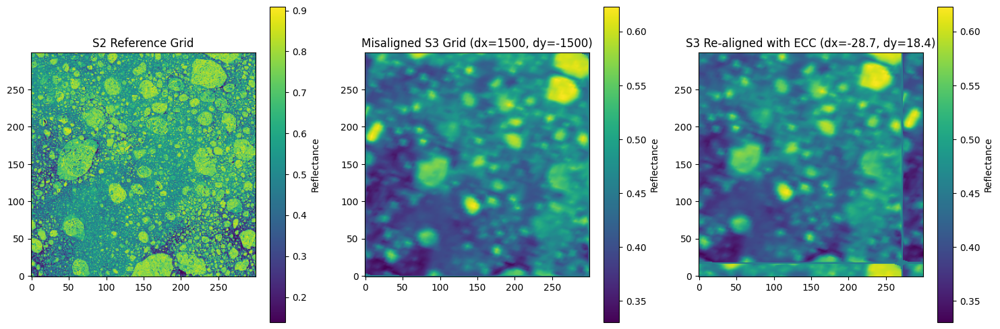

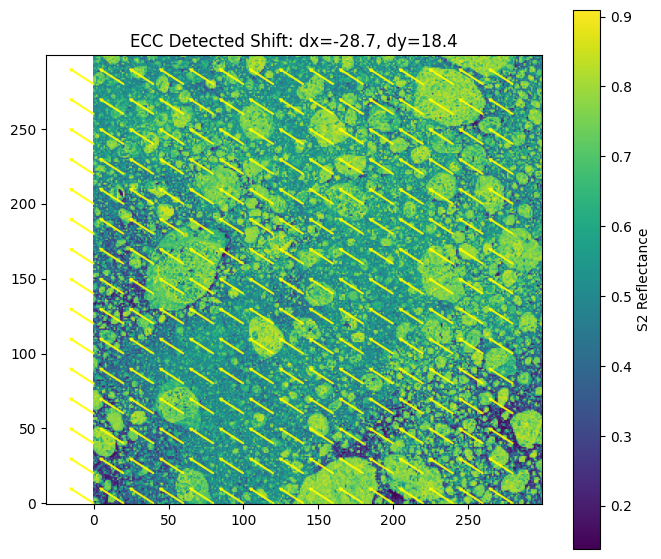

Pixel shift=(-28.676742553710938, 18.35066795349121) -> real shift=(-1918.1767594455478, 1227.4694283271715) meters


In [5]:
# CELL 2: FIND THE OPTIMAL SHIFT WITH ECC + VISUALISE VIA ARROWS

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import cv2
from matplotlib.patches import FancyArrow

# 1) Load the sub-subarea data
save_path = '/content/drive/MyDrive/GEOL0069/Week 6/Week_6_Part_2'

# We'll assume the same bounding box used in Cell 1
sub_x_min, sub_x_max = 530000.0, 550000.0
sub_y_min, sub_y_max = 7430000.0, 7450000.0

# Load the S2, S3 zoomed data
s2_data = np.load(save_path + '/s2_zoomed_data.npz')
s3_data = np.load(save_path + '/s3_zoomed_data.npz')

# 2) Extract the full arrays (before filtering)
s2_x_all, s2_y_all = s2_data['x'], s2_data['y']
s2_band_all = s2_data['band_data']

s3_x_all, s3_y_all = s3_data['x'], s3_data['y']
s3_band_all = s3_data['reflectance']

# 3) Load the manual misalignment values from Cell 1
try:
    noalign_data = np.load(save_path + '/training_data_subsubarea_noalign.npz')
    manual_dx, manual_dy = noalign_data['manual_misalignment']
    print(f"Loaded manual misalignment: dx={manual_dx}, dy={manual_dy}")
except:
    # Fallback if not saved
    manual_dx, manual_dy = 2000, -2000
    print(f"Using default manual misalignment: dx={manual_dx}, dy={manual_dy}")

# 4) Apply the misalignment to full S3 dataset
s3_x_misaligned_all = s3_x_all + manual_dx
s3_y_misaligned_all = s3_y_all + manual_dy

# 5) Filter sub-subarea for S2
cond_s2_sub = (
    (s2_x_all >= sub_x_min) & (s2_x_all <= sub_x_max) &
    (s2_y_all >= sub_y_min) & (s2_y_all <= sub_y_max)
)
s2_x = s2_x_all[cond_s2_sub]
s2_y = s2_y_all[cond_s2_sub]
z_s2_band0 = s2_band_all[cond_s2_sub, 0] / 10000.0

# 6) Filter misaligned S3 for sub-subarea
cond_s3_misaligned_sub = (
    (s3_x_misaligned_all >= sub_x_min) & (s3_x_misaligned_all <= sub_x_max) &
    (s3_y_misaligned_all >= sub_y_min) & (s3_y_misaligned_all <= sub_y_max)
)
s3_x_misaligned = s3_x_misaligned_all[cond_s3_misaligned_sub]
s3_y_misaligned = s3_y_misaligned_all[cond_s3_misaligned_sub]
z_s3_band0 = s3_band_all[cond_s3_misaligned_sub, 0]  # S3 band 0

print(f"S2 sub-subarea points: {len(s2_x)}")
print(f"Misaligned S3 sub-subarea points: {len(s3_x_misaligned)}")

# First plot the actual point data before interpolation
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.scatter(s2_x, s2_y, c=z_s2_band0, cmap='viridis', s=1)
plt.colorbar(label='S2 Band 0 Reflectance')
plt.title('Original S2 Points (Before Interpolation)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)

plt.subplot(1,2,2)
plt.scatter(s3_x_misaligned, s3_y_misaligned, c=z_s3_band0, cmap='viridis', s=5)
plt.colorbar(label='S3 Band 0 Reflectance')
plt.title('Misaligned S3 Points (Before Interpolation)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)

plt.tight_layout()
plt.show()

# 7) Interpolate S2 & misaligned S3 band0 to grids for ECC

def interpolate_to_grid(xpts, ypts, vals, ngrid=300):
    x_min, x_max = xpts.min(), xpts.max()
    y_min, y_max = ypts.min(), ypts.max()
    x_grid = np.linspace(x_min, x_max, ngrid)
    y_grid = np.linspace(y_min, y_max, ngrid)
    xg, yg = np.meshgrid(x_grid, y_grid)
    z = griddata((xpts, ypts), vals, (xg, yg), method='linear')
    return xg, yg, z

ngrid = 300
# Create grid for S2
xg_s2, yg_s2, z_s2 = interpolate_to_grid(s2_x, s2_y, z_s2_band0, ngrid=ngrid)

# Create grid for misaligned S3 (already misaligned - no need to shift here)
xg_s3, yg_s3, z_s3 = interpolate_to_grid(s3_x_misaligned, s3_y_misaligned, z_s3_band0, ngrid=ngrid)

# Replace NaNs with mean for ECC
z_s2_filled = np.nan_to_num(z_s2, nan=np.nanmean(z_s2))
z_s3_filled = np.nan_to_num(z_s3, nan=np.nanmean(z_s3))

# Visualise the interpolated grids with consistent parameters
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(z_s2_filled, cmap='viridis', origin='lower')
plt.title('Interpolated S2 Band 0 Grid')
plt.colorbar(label='Reflectance')

plt.subplot(1,2,2)
plt.imshow(z_s3_filled, cmap='viridis', origin='lower')
plt.title('Interpolated Misaligned S3 Band 0 Grid')
plt.colorbar(label='Reflectance')

plt.tight_layout()
plt.show()


# 8) Run ECC to detect the misalignment between grids
# Convert to float32 for ECC
A = z_s2_filled.astype(np.float32)
B = z_s3_filled.astype(np.float32)

# Set up ECC parameters
warp_matrix = np.eye(2, 3, dtype=np.float32)
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 200, 1e-6)

# Run ECC
try:
    cc, warp_matrix = cv2.findTransformECC(A, B, warp_matrix, motionType=cv2.MOTION_TRANSLATION, criteria=criteria)
    dx_est, dy_est = -warp_matrix[0,2], -warp_matrix[1,2]
    print(f"[ECC] Detected misalignment: dx={dx_est:.2f}, dy={dy_est:.2f}, CC={cc:.4f}")
    print(f"Known manual misalignment: dx={manual_dx}, dy={manual_dy}")
    print(f"Correction should be approx: dx={-manual_dx}, dy={-manual_dy}")

    # Calculate pixel to coordinate conversion factors
    x_pixel_to_coord = (xg_s2[0,-1] - xg_s2[0,0]) / ngrid
    y_pixel_to_coord = (yg_s2[-1,0] - yg_s2[0,0]) / ngrid

    # Convert pixel shifts to coordinate shifts
    dx_est_coord = dx_est * x_pixel_to_coord
    dy_est_coord = dy_est * y_pixel_to_coord

    print(f"ECC detected shift in real coordinates: dx={dx_est_coord:.2f}, dy={dy_est_coord:.2f}")
except cv2.error as e:
    print("[ECC Failed]", e)
    dx_est, dy_est = None, None
    dx_est_coord, dy_est_coord = None, None

# Realign B using the estimated shift (if ECC succeeded)
if dx_est is not None and dy_est is not None:
    B_realigned = np.roll(np.roll(B, int(dy_est), axis=0), int(dx_est), axis=1)
else:
    B_realigned = B  # fallback

# Visualise the results
plt.figure(figsize=(15,5))

# Original S2 reference grid
plt.subplot(1,3,1)
plt.imshow(A, cmap='viridis', origin='lower')
plt.title("S2 Reference Grid")
plt.colorbar(label='Reflectance')

# Misaligned S3 grid
plt.subplot(1,3,2)
plt.imshow(B, cmap='viridis', origin='lower')
plt.title(f"Misaligned S3 Grid (dx={manual_dx}, dy={manual_dy})")
plt.colorbar(label='Reflectance')

# ECC-realigned S3 grid
plt.subplot(1,3,3)
plt.imshow(B_realigned, cmap='viridis', origin='lower')
if dx_est is not None and dy_est is not None:
    plt.title(f"S3 Re-aligned with ECC (dx={dx_est:.1f}, dy={dy_est:.1f})")
else:
    plt.title("S3 (ECC alignment failed)")
plt.colorbar(label='Reflectance')

plt.tight_layout()
plt.show()

# Visualise the shift with arrows
if dx_est is not None and dy_est is not None:
    plt.figure(figsize=(8,7))
    plt.imshow(A, cmap='viridis', origin='lower')
    plt.title(f"ECC Detected Shift: dx={dx_est:.1f}, dy={dy_est:.1f}")

    # Draw arrows showing the detected shift
    h, w = A.shape
    step = 20
    rows = np.arange(0, h, step)
    cols = np.arange(0, w, step)

    for r in rows:
        for c in cols:
            plt.arrow(c, r, dx_est/2, dy_est/2, color="yellow",
                      width=0.5, head_width=2, head_length=2, alpha=0.8)

    plt.colorbar(label='S2 Reflectance')
    plt.show()

# Suppose we have a sub-subarea bounding box:
sub_x_min, sub_x_max = 530000.0, 550000.0
sub_y_min, sub_y_max = 7430000.0, 7450000.0
ngrid = 300

# 1) Pixel size in X and Y
delta_x_per_pixel = (sub_x_max - sub_x_min) / (ngrid - 1)  # e.g. 20,000/299 ~ 67 m
delta_y_per_pixel = (sub_y_max - sub_y_min) / (ngrid - 1)  # e.g. ~67 m

# 2) Suppose we want a 20-pixel shift in the interpolation grid
pixel_shift_x = dx_est
pixel_shift_y = dy_est

# 3) Convert pixel shift to real coordinates
real_dx = pixel_shift_x * delta_x_per_pixel
real_dy = pixel_shift_y * delta_y_per_pixel

print(f"Pixel shift=({pixel_shift_x}, {pixel_shift_y}) -> real shift=({real_dx}, {real_dy}) meters")


## Scenario 2: Building a Training Dataset with ECC Alignment

In this cell, we:

1. **Load** the manually misaligned S3 data from Scenario 1 and the **ECC-detected shift** from Cell 2.
2. **Apply** the manual misalignment and then **add** the ECC-based correction to realign S3.
3. **Filter** the original, misaligned, and aligned S3 points within the same sub-subarea bounds, and **compare** them visually alongside S2.
4. **Use KDTree** to associate S2 pixels with the **ECC-aligned** S3 pixels, then **average** MPF values at each S3 location.
5. **Save** the final “aligned” training dataset—this time ensuring that S3 coordinates are as close as possible to S2 references.

This lets us see how **alignment** improves the match between S2 and S3.

Using provided ECC shift: dx=-1918.1767594455478, dy=1227.4694283271715
Assumed manual misalignment: dx=1500, dy=-1500
S2 points in sub-subarea: 1002001
Original S3 points in sub-subarea: 5067
Misaligned S3 points in sub-subarea: 5057
ECC-aligned S3 points in sub-subarea: 5065


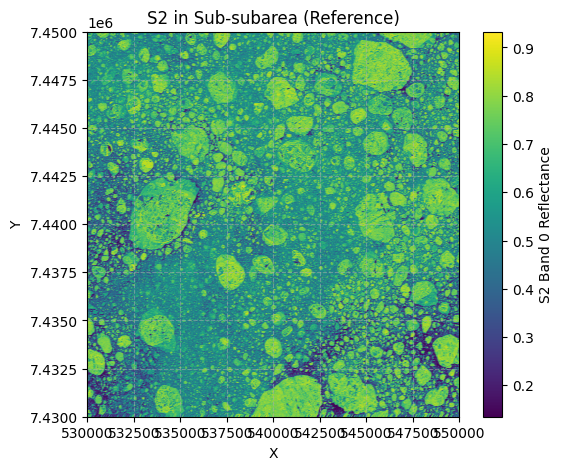

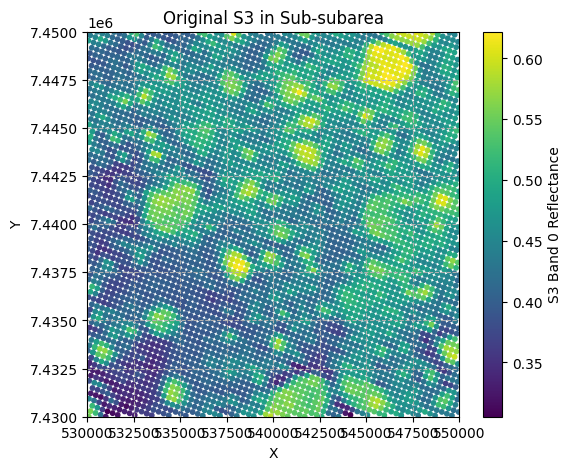

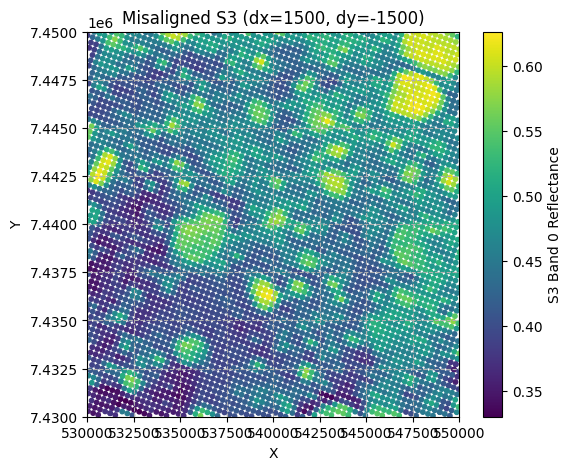

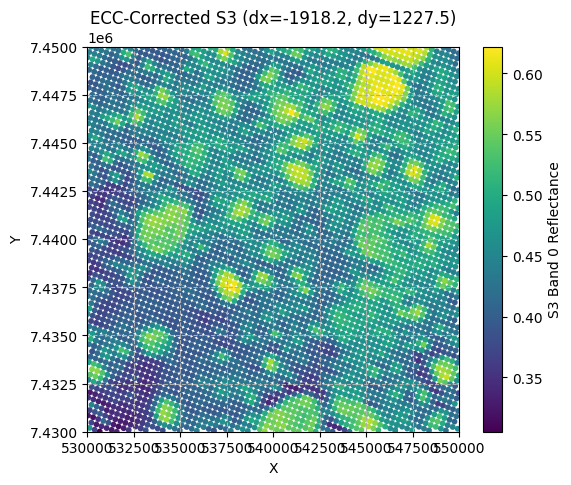

<ipython-input-6-4ecd6d6f54af>:148: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


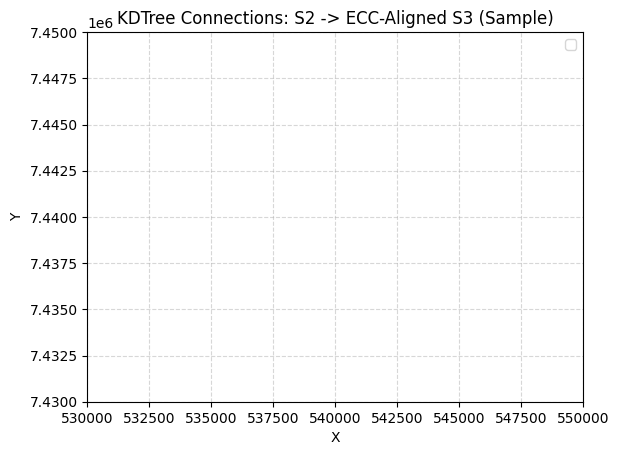

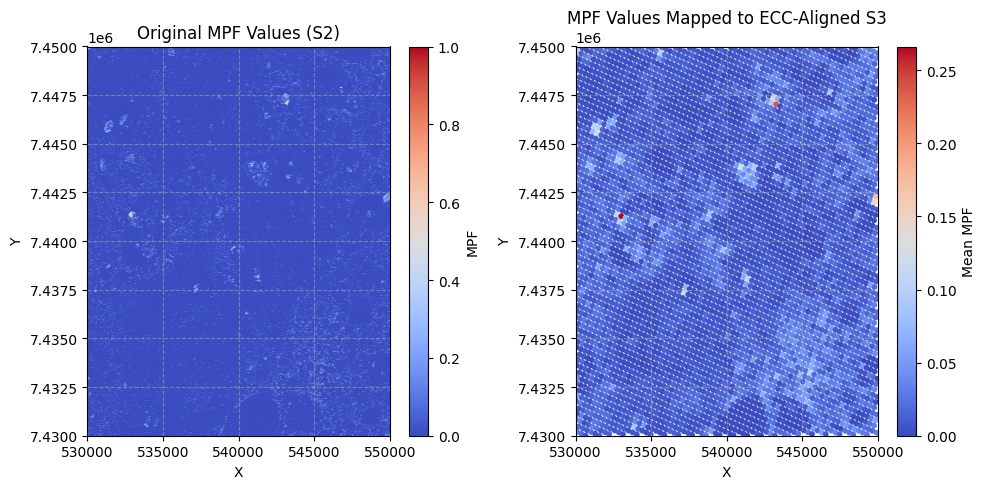

Scenario 2 done. Training dataset (WITH ECC ALIGNMENT) saved.


In [6]:
# SCENARIO 2: CREATE TRAINING DATASET WITH ECC-BASED ALIGNMENT
import numpy as np
from scipy.spatial import KDTree
from collections import defaultdict
import matplotlib.pyplot as plt

save_path = '/content/drive/MyDrive/GEOL0069/Week 6/Week_6_Part_2'


# Use the values you found if file not available
dx_est, dy_est = -1918.1767594455478, 1227.4694283271715# <-- Using the shift values you provided
print(f"Using provided ECC shift: dx={dx_est}, dy={dy_est}")

# 2) Load the manual misalignment for comparison

manual_dx, manual_dy = 1500, -1500
print(f"Assumed manual misalignment: dx={manual_dx}, dy={manual_dy}")

# 3) Load the full datasets
s2_data = np.load(save_path + '/s2_zoomed_data.npz')
s3_data = np.load(save_path + '/s3_zoomed_data.npz')
mpf_data = np.load(save_path + '/mpf_zoomed_data.npz')

# Define sub-subarea
sub_x_min, sub_x_max = 530000.0, 550000.0
sub_y_min, sub_y_max = 7430000.0, 7450000.0

# 4) Extract full arrays
s2_x_all, s2_y_all = s2_data['x'], s2_data['y']
band_s2_all = s2_data['band_data']
mpf_all = mpf_data['mpf']

s3_x_all, s3_y_all = s3_data['x'], s3_data['y']
band_s3_all = s3_data['reflectance']

# 5) Filter S2 data for sub-subarea
cond_s2_sub = (
    (s2_x_all >= sub_x_min) & (s2_x_all <= sub_x_max) &
    (s2_y_all >= sub_y_min) & (s2_y_all <= sub_y_max)
)
s2_x = s2_x_all[cond_s2_sub]
s2_y = s2_y_all[cond_s2_sub]
band_s2 = band_s2_all[cond_s2_sub]
mpf_vals = mpf_all[cond_s2_sub]

# 6) Apply steps to S3 with the full dataset
# Step 1: Apply the manual misalignment to the FULL S3 dataset
s3_x_misaligned_all = s3_x_all + manual_dx
s3_y_misaligned_all = s3_y_all + manual_dy

# Step 2: Apply the ECC correction to get aligned coordinates
s3_x_aligned_all = s3_x_misaligned_all + dx_est
s3_y_aligned_all = s3_y_misaligned_all + dy_est

# 7) Filter the original, misaligned, and aligned S3 for the sub-subarea
# Original S3 in sub-subarea
cond_s3_original_sub = (
    (s3_x_all >= sub_x_min) & (s3_x_all <= sub_x_max) &
    (s3_y_all >= sub_y_min) & (s3_y_all <= sub_y_max)
)
s3_x_original = s3_x_all[cond_s3_original_sub]
s3_y_original = s3_y_all[cond_s3_original_sub]
band_s3_original = band_s3_all[cond_s3_original_sub]

# Misaligned S3 in sub-subarea
cond_s3_misaligned_sub = (
    (s3_x_misaligned_all >= sub_x_min) & (s3_x_misaligned_all <= sub_x_max) &
    (s3_y_misaligned_all >= sub_y_min) & (s3_y_misaligned_all <= sub_y_max)
)
s3_x_misaligned = s3_x_misaligned_all[cond_s3_misaligned_sub]
s3_y_misaligned = s3_y_misaligned_all[cond_s3_misaligned_sub]
band_s3_misaligned = band_s3_all[cond_s3_misaligned_sub]

# ECC-aligned S3 in sub-subarea
cond_s3_aligned_sub = (
    (s3_x_aligned_all >= sub_x_min) & (s3_x_aligned_all <= sub_x_max) &
    (s3_y_aligned_all >= sub_y_min) & (s3_y_aligned_all <= sub_y_max)
)
s3_x_aligned = s3_x_aligned_all[cond_s3_aligned_sub]
s3_y_aligned = s3_y_aligned_all[cond_s3_aligned_sub]
band_s3_aligned = band_s3_all[cond_s3_aligned_sub]

print(f"S2 points in sub-subarea: {len(s2_x)}")
print(f"Original S3 points in sub-subarea: {len(s3_x_original)}")
print(f"Misaligned S3 points in sub-subarea: {len(s3_x_misaligned)}")
print(f"ECC-aligned S3 points in sub-subarea: {len(s3_x_aligned)}")

# 8) Plot all versions to compare
# S2 reference data
plt.figure(figsize=(6,5))
plt.scatter(s2_x, s2_y, c=band_s2[:,0]/10000, cmap='viridis', s=2)
plt.colorbar(label='S2 Band 0 Reflectance')
plt.title('S2 in Sub-subarea (Reference)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.xlabel('X'); plt.ylabel('Y')
plt.show()

# Original S3 data
plt.figure(figsize=(6,5))
plt.scatter(s3_x_original, s3_y_original, c=band_s3_original[:,0], cmap='viridis', s=10)
plt.colorbar(label='S3 Band 0 Reflectance')
plt.title('Original S3 in Sub-subarea')
plt.grid(True, linestyle='--')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.xlabel('X'); plt.ylabel('Y')
plt.show()

# Misaligned S3 data
plt.figure(figsize=(6,5))
plt.scatter(s3_x_misaligned, s3_y_misaligned, c=band_s3_misaligned[:,0], cmap='viridis', s=10)
plt.colorbar(label='S3 Band 0 Reflectance')
plt.title(f'Misaligned S3 (dx={manual_dx}, dy={manual_dy})')
plt.grid(True, linestyle='--')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.xlabel('X'); plt.ylabel('Y')
plt.show()

# ECC-aligned S3 data
plt.figure(figsize=(6,5))
plt.scatter(s3_x_aligned, s3_y_aligned, c=band_s3_aligned[:,0], cmap='viridis', s=10)
plt.colorbar(label='S3 Band 0 Reflectance')
plt.title(f'ECC-Corrected S3 (dx={dx_est:.1f}, dy={dy_est:.1f})')
plt.grid(True, linestyle='--')
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.xlabel('X'); plt.ylabel('Y')
plt.show()


# 9) Use KDTree to associate S2 -> ECC-aligned S3
s2_points = np.vstack((s2_x, s2_y)).T
s3_points_aligned = np.vstack((s3_x_aligned, s3_y_aligned)).T
tree_aligned = KDTree(s3_points_aligned)

# Find nearest aligned S3 point for each S2 point
distances, s3_idx_for_s2 = tree_aligned.query(s2_points)



plt.title('KDTree Connections: S2 -> ECC-Aligned S3 (Sample)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.legend()
plt.xlabel('X'); plt.ylabel('Y')
plt.show()

# 10) Group S2 indices by S3 index for the aligned data
grouped = defaultdict(list)
for s2_i, s3_i in enumerate(s3_idx_for_s2):
    grouped[s3_i].append(s2_i)

# 11) Compute mean MPF for each aligned S3 pixel
mpf_avg_aligned = np.full(len(s3_points_aligned), np.nan)
for s3_i, s2_list in grouped.items():
    mpf_vals_for_s3 = mpf_vals[s2_list]
    if np.any(~np.isnan(mpf_vals_for_s3)):
        mpf_avg_aligned[s3_i] = np.nanmean(mpf_vals_for_s3)

valid_idx = ~np.isnan(mpf_avg_aligned)
s3_x_align_clean = s3_x_aligned[valid_idx]
s3_y_align_clean = s3_y_aligned[valid_idx]
band_s3_align_clean = band_s3_aligned[valid_idx]
mpf_align_clean = mpf_avg_aligned[valid_idx]

# 12) Compare original MPF vs ECC-aligned MPF
plt.figure(figsize=(10,5))

# S2 MPF (Original reference)
plt.subplot(1, 2, 1)
plt.scatter(s2_x, s2_y, c=mpf_vals, cmap='coolwarm', s=3)
plt.colorbar(label='MPF')
plt.title('Original MPF Values (S2)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.xlabel('X'); plt.ylabel('Y')

# ECC-aligned S3-derived MPF
plt.subplot(1, 2, 2)
plt.scatter(s3_x_align_clean, s3_y_align_clean, c=mpf_align_clean, cmap='coolwarm', s=10)
plt.colorbar(label='Mean MPF')
plt.title('MPF Values Mapped to ECC-Aligned S3')
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(sub_x_min, sub_x_max)
plt.ylim(sub_y_min, sub_y_max)
plt.xlabel('X'); plt.ylabel('Y')

plt.tight_layout()
plt.show()

# 13) Save the aligned dataset
training_data_aligned = {
    "s3_x_aligned": s3_x_align_clean,
    "s3_y_aligned": s3_y_align_clean,
    "s3_features": band_s3_align_clean,
    "mpf_target": mpf_align_clean,
    "manual_misalignment": np.array([manual_dx, manual_dy]),
    "ecc_correction": np.array([dx_est, dy_est])
}
np.savez(save_path + '/training_data_subsubarea_aligned.npz', **training_data_aligned)
print("Scenario 2 done. Training dataset (WITH ECC ALIGNMENT) saved.")

# Regression Application on Melt Pond Fractions (MPF)

This notebook applies regression models to predict **Melt Pond Fraction (MPF)** using co-located **Sentinel-2** (S2) and **Sentinel-3** (S3) data. The aim is to **evaluate the impact of spatial alignment between S2 and S3 data on model performance**.

The notebook uses two training datasets:
- **Aligned training data:** S3 coordinates corrected using ECC-based alignment.
- **Misaligned training data:** S3 coordinates with a known artificial shift applied.

A separate **test area** is selected to evaluate generalization performance.

## Workflow Overview

### Load Training and Test Data
- Loads pre-processed **aligned** and **misaligned** training datasets.
- Loads test data (from a different area).
- Applies **feature scaling** to ensure all models work on normalized data.

### Polynomial Regression Models
- Trains **polynomial regression (degree 2)** models using both aligned and misaligned data.
- Makes MPF predictions on the test set.
- Evaluates performance using **Mean Squared Error (MSE)** and **R²**.
- Visualizes:
    - Predicted MPF maps across the test area.
    - Actual vs. predicted MPF scatter plots.

### Neural Network Models
- Trains **identical feedforward neural networks (same architecture)** on both aligned and misaligned data.
- Makes MPF predictions on the test set.
- Evaluates and visualizes results, similar to polynomial models.

### Gaussian Process Regression Models
- Applies **Sparse Gaussian Process Regression (GPR)** for efficient modeling on larger datasets.
- Trains models separately for aligned and misaligned data.
- Generates MPF predictions and visualizations.
- Uses **subsampling techniques** to make GPR computationally feasible.

###  Summary and Model Comparison
- Combines performance metrics (MSE, R²) for all models.
- Calculates the **percentage improvement from alignment** for each model type.
- Produces **summary bar plots** comparing performance across all models and alignment settings.

## Key Objective
This notebook directly **quantifies the benefit of spatial alignment (correcting for sea ice drift and sensor mismatch) on MPF prediction accuracy**, providing insight into how critical precise co-location is for multi-sensor fusion in polar remote sensing.

---

## Test Data Preparation & Data Loading

### Cell 1: Extract Test Data from a New Sub-Subarea
- Loads **Sentinel-2 (S2)**, **Sentinel-3 (S3)**, and **Melt Pond Fraction (MPF)** data.
- Defines a new **test sub-subarea** distinct from the training area.
- Filters S2, S3, and MPF data to match this new area.
- Uses **KDTree** to associate S2 pixels with their nearest S3 pixels.
- Computes the **mean MPF for each S3 pixel**, effectively mapping MPF onto the S3 grid.
- Visualises S2 reflectance, MPF, and S3 reflectance in the test area.
- Saves the resulting **test dataset** for use in model evaluation.

---

### Cell 2: Load and Prepare Training and Test Data
- Loads:
    - **Aligned training data** (after ECC correction)
    - **Misaligned training data** (with manually applied shift)
    - **Test data** (extracted in the previous cell)
- Separately scales features for:
    - Aligned training and test data.
    - Misaligned training and test data.
- Prepares normalized input features (`X`) and target MPF (`y`) for both aligned and misaligned cases.
- Displays the number of training and test samples for both scenarios.


S2 points in test area: 501501
S3 points in test area: 2534


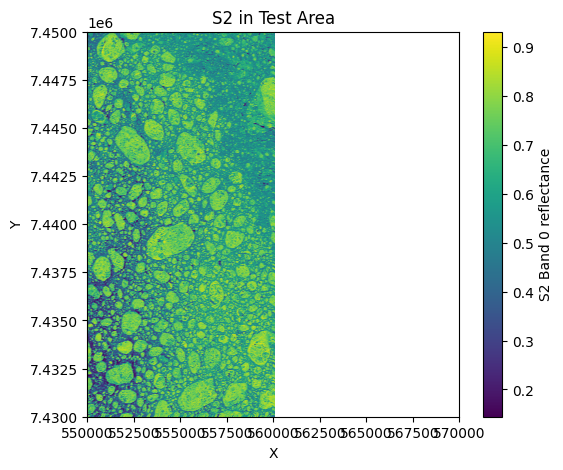

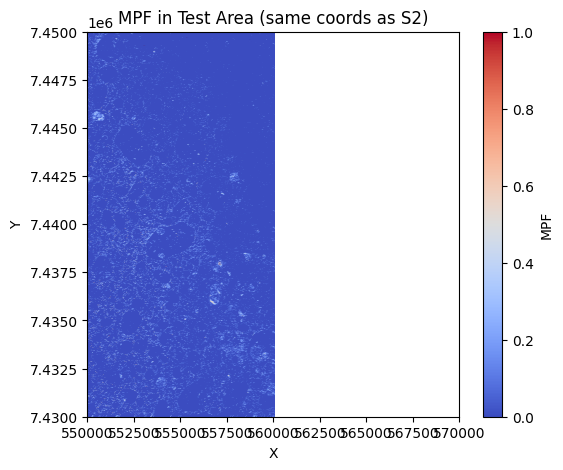

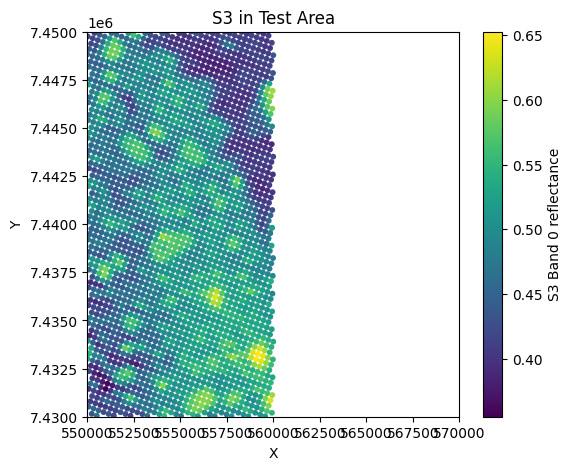

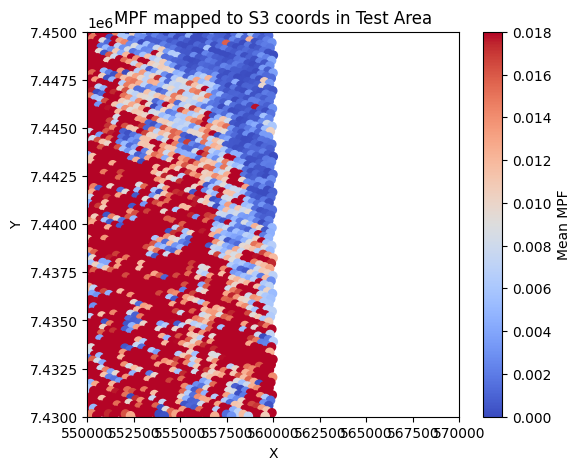

Test data extraction complete.


In [7]:

import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import KDTree
from collections import defaultdict

# 1) Load zoomed S2, S3, MPF data
save_path = '/content/drive/MyDrive/GEOL0069/Week 6/Week_6_Part_2'
s2_data = np.load(save_path + '/s2_zoomed_data.npz')
s3_data = np.load(save_path + '/s3_zoomed_data.npz')
mpf_data = np.load(save_path + '/mpf_zoomed_data.npz')

# 2) Extract arrays
s2_x_all, s2_y_all = s2_data['x'], s2_data['y']
band_s2_all = s2_data['band_data']
mpf_all = mpf_data['mpf']
s3_x_all, s3_y_all = s3_data['x'], s3_data['y']
band_s3_all = s3_data['reflectance']

# 3) Define a test sub-subarea (different from training area)
test_x_min, test_x_max = 550000.0, 570000.0
test_y_min, test_y_max = 7430000.0, 7450000.0

# Filter S2 & MPF
cond_s2_test = (
    (s2_x_all >= test_x_min) & (s2_x_all <= test_x_max) &
    (s2_y_all >= test_y_min) & (s2_y_all <= test_y_max)
)
s2_x = s2_x_all[cond_s2_test]
s2_y = s2_y_all[cond_s2_test]
band_s2 = band_s2_all[cond_s2_test]
mpf_vals = mpf_all[cond_s2_test]

#  Filter S3
cond_s3_test = (
    (s3_x_all >= test_x_min) & (s3_x_all <= test_x_max) &
    (s3_y_all >= test_y_min) & (s3_y_all <= test_y_max)
)
s3_x = s3_x_all[cond_s3_test]
s3_y = s3_y_all[cond_s3_test]
band_s3 = band_s3_all[cond_s3_test]

print(f"S2 points in test area: {len(s2_x)}")
print(f"S3 points in test area: {len(s3_x)}")

# 4) PLOT S2, MPF, and S3 in test area
plt.figure(figsize=(6,5))
plt.scatter(s2_x, s2_y, c=band_s2[:, 0]/10000.0, cmap='viridis', s=1)
plt.colorbar(label='S2 Band 0 reflectance')
plt.title('S2 in Test Area')
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(test_x_min, test_x_max)
plt.ylim(test_y_min, test_y_max)
plt.show()

plt.figure(figsize=(6,5))
plt.scatter(s2_x, s2_y, c=mpf_vals, cmap='coolwarm', s=1)
plt.colorbar(label='MPF')
plt.title('MPF in Test Area (same coords as S2)')
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(test_x_min, test_x_max)
plt.ylim(test_y_min, test_y_max)
plt.show()

plt.figure(figsize=(6,5))
plt.scatter(s3_x, s3_y, c=band_s3[:, 0], cmap='viridis', s=10)
plt.colorbar(label='S3 Band 0 reflectance')
plt.title('S3 in Test Area')
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(test_x_min, test_x_max)
plt.ylim(test_y_min, test_y_max)
plt.show()

# 5) Use KDTree to associate S2 -> S3
s2_points = np.vstack((s2_x, s2_y)).T
s3_points = np.vstack((s3_x, s3_y)).T
tree = KDTree(s3_points)

distances, s3_idx_for_s2 = tree.query(s2_points)

# 6) Group S2 indices by S3 index
grouped = defaultdict(list)
for s2_idx, s3_idx in enumerate(s3_idx_for_s2):
    grouped[s3_idx].append(s2_idx)

# 7) Compute mean MPF for each S3 pixel
mpf_avg = np.full(len(s3_points), np.nan)
for s3_i, s2_list in grouped.items():
    mpf_for_this_s3 = mpf_vals[s2_list]
    if np.any(~np.isnan(mpf_for_this_s3)):
        mpf_avg[s3_i] = np.nanmean(mpf_for_this_s3)

# 8) Remove NaNs
valid_s3 = ~np.isnan(mpf_avg)
s3_x_clean = s3_x[valid_s3]
s3_y_clean = s3_y[valid_s3]
band_s3_clean = band_s3[valid_s3]
mpf_clean = mpf_avg[valid_s3]

# 9) Plot the S3-located MPF distribution
plt.figure(figsize=(6,5))
plt.scatter(s3_x_clean, s3_y_clean, c=mpf_clean, cmap='coolwarm', s=35,vmin=0,vmax=0.018)
plt.colorbar(label='Mean MPF')
plt.title('MPF mapped to S3 coords in Test Area')
plt.xlabel('X'); plt.ylabel('Y')
plt.xlim(test_x_min, test_x_max)
plt.ylim(test_y_min, test_y_max)
plt.show()

# 10) Save dataset
test_data = {
    "s3_x": s3_x_clean,
    "s3_y": s3_y_clean,
    "s3_features": band_s3_clean,
    "mpf_target": mpf_clean
}
np.savez(save_path + '/test_data.npz', **test_data)
print("Test data extraction complete.")

In [8]:
# Cell 1: Load Training and Test Data
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Load aligned training data
train_align = np.load('/content/drive/MyDrive/GEOL0069/Week 6/Week_6_Part_2/training_data_subsubarea_aligned.npz')
X_train_align_raw = train_align['s3_features']
y_train_align = train_align['mpf_target']

# Load misaligned training data
train_noalign = np.load('/content/drive/MyDrive/GEOL0069/Week 6/Week_6_Part_2/training_data_subsubarea_noalign.npz')
X_train_noalign_raw = train_noalign['s3_features']
y_train_noalign = train_noalign['mpf_target']

# Load test data
test_data = np.load('/content/drive/MyDrive/GEOL0069/Week 6/Week_6_Part_2/test_data.npz')
X_test_raw = test_data['s3_features']
y_test = test_data['mpf_target']
test_x = test_data['s3_x']
test_y = test_data['s3_y']

# Normalise data
scaler_align = StandardScaler()
X_train_align = scaler_align.fit_transform(X_train_align_raw)
X_test_align = scaler_align.transform(X_test_raw)

scaler_noalign = StandardScaler()
X_train_noalign = scaler_noalign.fit_transform(X_train_noalign_raw)
X_test_noalign = scaler_noalign.transform(X_test_raw)

print(f"Aligned data: {X_train_align.shape[0]} training samples, {X_test_align.shape[0]} test samples")
print(f"Misaligned data: {X_train_noalign.shape[0]} training samples, {X_test_noalign.shape[0]} test samples")

Aligned data: 4733 training samples, 2386 test samples
Misaligned data: 4725 training samples, 2386 test samples


## Polynomial Regression Models

Polynomial Regression (Degree 2) Results:
Aligned Model: MSE = 0.0001, R² = 0.4985
Misaligned Model: MSE = 0.0002, R² = 0.1431


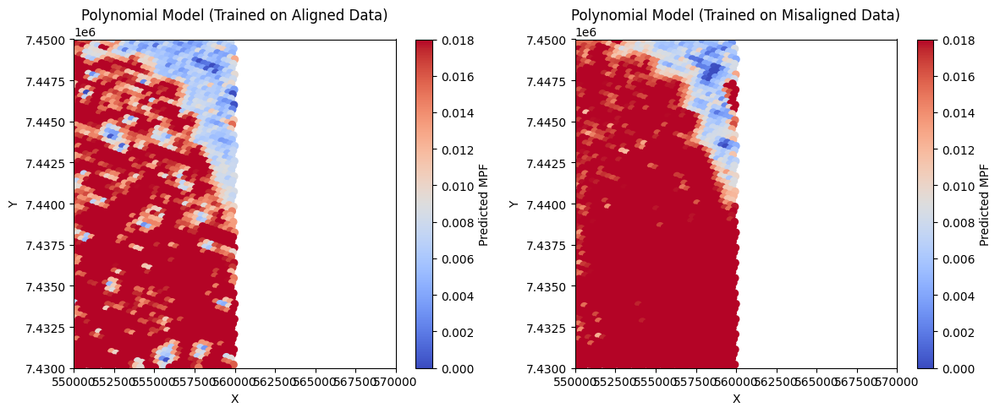

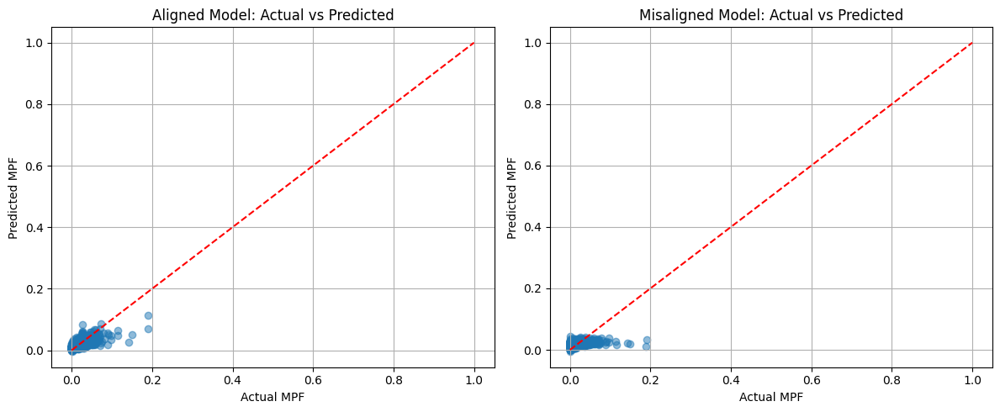

In [9]:
# Cell 2: Polynomial Regression Models
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Polynomial features
poly = PolynomialFeatures(degree=2)

# Aligned data model
X_poly_train_align = poly.fit_transform(X_train_align)
model_poly_align = LinearRegression()
model_poly_align.fit(X_poly_train_align, y_train_align)

# Misaligned data model
X_poly_train_noalign = poly.fit_transform(X_train_noalign)
model_poly_noalign = LinearRegression()
model_poly_noalign.fit(X_poly_train_noalign, y_train_noalign)

# Test predictions
X_poly_test_align = poly.transform(X_test_align)
y_pred_poly_align = model_poly_align.predict(X_poly_test_align)

X_poly_test_noalign = poly.transform(X_test_noalign)
y_pred_poly_noalign = model_poly_noalign.predict(X_poly_test_noalign)

# Calculate metrics
mse_align = mean_squared_error(y_test, y_pred_poly_align)
r2_align = r2_score(y_test, y_pred_poly_align)

mse_noalign = mean_squared_error(y_test, y_pred_poly_noalign)
r2_noalign = r2_score(y_test, y_pred_poly_noalign)

print("Polynomial Regression (Degree 2) Results:")
print(f"Aligned Model: MSE = {mse_align:.4f}, R² = {r2_align:.4f}")
print(f"Misaligned Model: MSE = {mse_noalign:.4f}, R² = {r2_noalign:.4f}")

# Plot predicted MPF maps
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sc1 = plt.scatter(test_x, test_y, c=y_pred_poly_align, cmap='coolwarm', s=35,vmin=0,vmax=0.018)
plt.colorbar(sc1, label='Predicted MPF')
plt.title('Polynomial Model (Trained on Aligned Data)')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(550000, 570000)
plt.ylim(7430000, 7450000)

plt.subplot(1, 2, 2)
sc2 = plt.scatter(test_x, test_y, c=y_pred_poly_noalign, cmap='coolwarm', s=35,vmin=0,vmax=0.018)
plt.colorbar(sc2, label='Predicted MPF')
plt.title('Polynomial Model (Trained on Misaligned Data)')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(550000, 570000)
plt.ylim(7430000, 7450000)

plt.tight_layout()
plt.show()

# Plot actual vs predicted
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_poly_align, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('Actual MPF')
plt.ylabel('Predicted MPF')
plt.title('Aligned Model: Actual vs Predicted')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_poly_noalign, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('Actual MPF')
plt.ylabel('Predicted MPF')
plt.title('Misaligned Model: Actual vs Predicted')
plt.grid(True)

plt.tight_layout()
plt.show()

## Neural Network Regression Model

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Neural Network Results:
Aligned Model: MSE = 0.0004, R² = -0.6423
Misaligned Model: MSE = 0.0003, R² = -0.1164


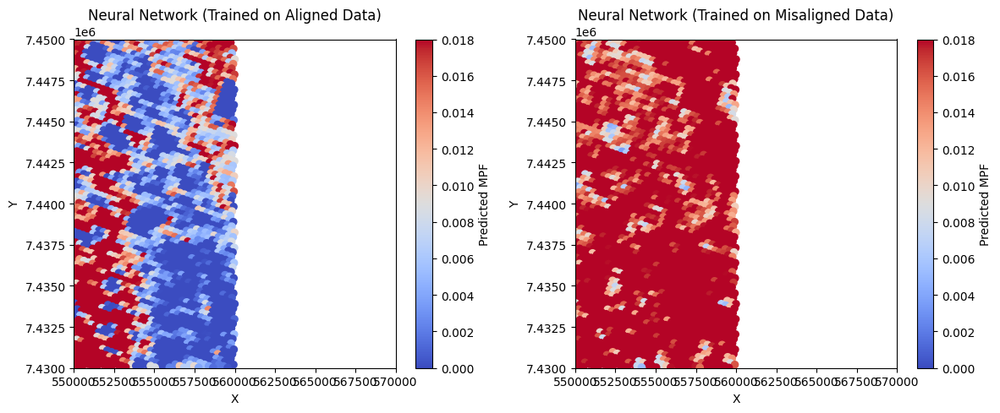

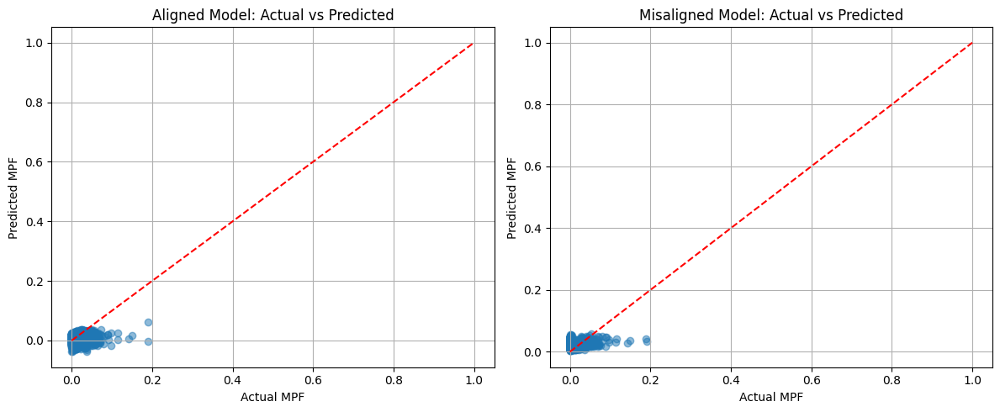

In [10]:
# Cell 3: Neural Network Models
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# For reproducibility
tf.random.set_seed(42)

# Function to create model with same architecture
def create_nn_model(input_dim):
    model = Sequential([
        Dense(512, activation='relu', input_shape=(input_dim,)),
        Dense(512, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Train model on aligned data
model_nn_align = create_nn_model(X_train_align.shape[1])
model_nn_align.fit(
    X_train_align, y_train_align,
    epochs=10,
    batch_size=32,
    verbose=0
)

# Train model on misaligned data
model_nn_noalign = create_nn_model(X_train_noalign.shape[1])
model_nn_noalign.fit(
    X_train_noalign, y_train_noalign,
    epochs=10,
    batch_size=32,
    verbose=0
)

# Test predictions
y_pred_nn_align = model_nn_align.predict(X_test_align).flatten()
y_pred_nn_noalign = model_nn_noalign.predict(X_test_noalign).flatten()

# Calculate metrics
mse_align = mean_squared_error(y_test, y_pred_nn_align)
r2_align = r2_score(y_test, y_pred_nn_align)

mse_noalign = mean_squared_error(y_test, y_pred_nn_noalign)
r2_noalign = r2_score(y_test, y_pred_nn_noalign)

print("Neural Network Results:")
print(f"Aligned Model: MSE = {mse_align:.4f}, R² = {r2_align:.4f}")
print(f"Misaligned Model: MSE = {mse_noalign:.4f}, R² = {r2_noalign:.4f}")

# Plot predicted MPF maps
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sc1 = plt.scatter(test_x, test_y, c=y_pred_nn_align, cmap='coolwarm', s=35,vmin=0,vmax=0.018)
plt.colorbar(sc1, label='Predicted MPF')
plt.title('Neural Network (Trained on Aligned Data)')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(550000, 570000)
plt.ylim(7430000, 7450000)

plt.subplot(1, 2, 2)
sc2 = plt.scatter(test_x, test_y, c=y_pred_nn_noalign, cmap='coolwarm', s=35,vmin=0,vmax=0.018)
plt.colorbar(sc2, label='Predicted MPF')
plt.title('Neural Network (Trained on Misaligned Data)')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(550000, 570000)
plt.ylim(7430000, 7450000)

plt.tight_layout()
plt.show()

# Plot actual vs predicted
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_nn_align, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('Actual MPF')
plt.ylabel('Predicted MPF')
plt.title('Aligned Model: Actual vs Predicted')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_nn_noalign, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('Actual MPF')
plt.ylabel('Predicted MPF')
plt.title('Misaligned Model: Actual vs Predicted')
plt.grid(True)

plt.tight_layout()
plt.show()

# Gaussian Processes Regression Model

In [11]:
!pip install Gpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 17.3 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1


Gaussian Process Regression Results:
Aligned Model: MSE = 0.0002, R² = 0.4018
Misaligned Model: MSE = 0.0002, R² = 0.0910


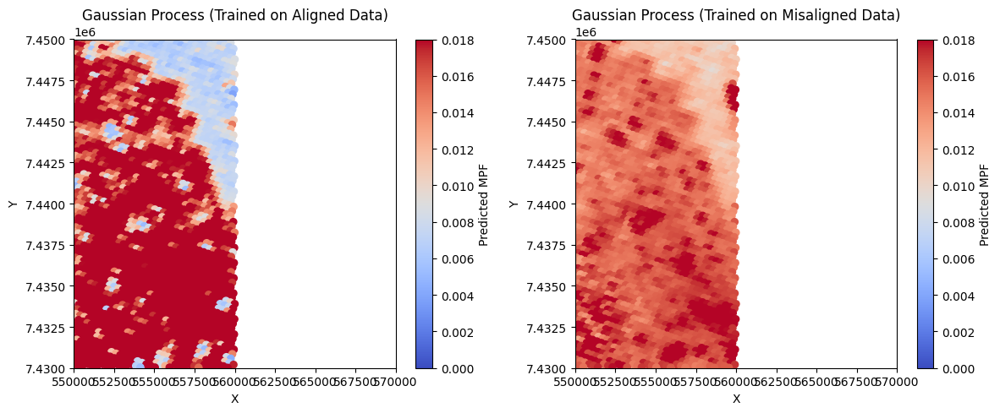

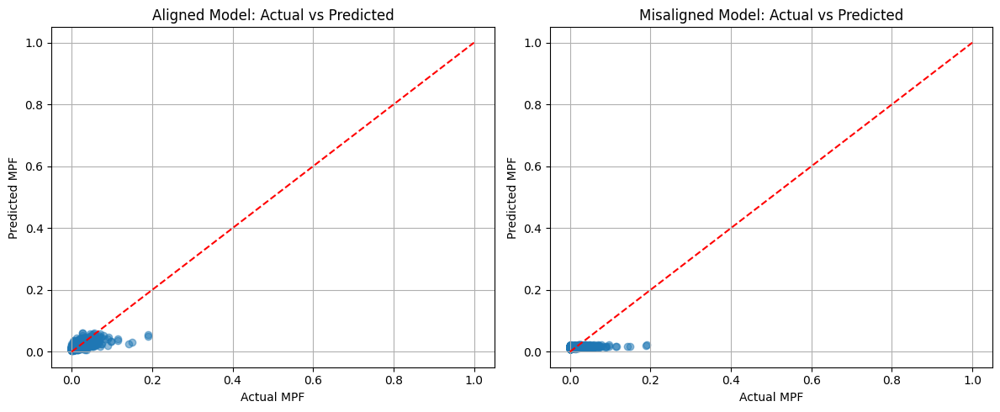

In [12]:
# Cell 4: Gaussian Process Regression Models
import GPy
import numpy as np

# For computational efficiency with GPR, subsample if datasets are large
max_train_samples = 1000

if X_train_align.shape[0] > max_train_samples:
    idx_align = np.random.choice(X_train_align.shape[0], max_train_samples, replace=False)
    X_train_align_sub = X_train_align[idx_align]
    y_train_align_sub = y_train_align[idx_align]
else:
    X_train_align_sub = X_train_align
    y_train_align_sub = y_train_align

if X_train_noalign.shape[0] > max_train_samples:
    idx_noalign = np.random.choice(X_train_noalign.shape[0], max_train_samples, replace=False)
    X_train_noalign_sub = X_train_noalign[idx_noalign]
    y_train_noalign_sub = y_train_noalign[idx_noalign]
else:
    X_train_noalign_sub = X_train_noalign
    y_train_noalign_sub = y_train_noalign

# Aligned model
kernel_align = GPy.kern.RBF(input_dim=X_train_align_sub.shape[1])
num_inducing = min(100, X_train_align_sub.shape[0] // 2)
gp_align = GPy.models.SparseGPRegression(
    X_train_align_sub,
    y_train_align_sub.reshape(-1, 1),
    kernel_align,
    num_inducing=num_inducing
)
gp_align.optimize(messages=False)

# Misaligned model
kernel_noalign = GPy.kern.RBF(input_dim=X_train_noalign_sub.shape[1])
num_inducing = min(100, X_train_noalign_sub.shape[0] // 2)
gp_noalign = GPy.models.SparseGPRegression(
    X_train_noalign_sub,
    y_train_noalign_sub.reshape(-1, 1),
    kernel_noalign,
    num_inducing=num_inducing
)
gp_noalign.optimize(messages=False)

# Test predictions
y_pred_gp_align, _ = gp_align.predict(X_test_align)
y_pred_gp_align = y_pred_gp_align.flatten()

y_pred_gp_noalign, _ = gp_noalign.predict(X_test_noalign)
y_pred_gp_noalign = y_pred_gp_noalign.flatten()

# Calculate metrics
mse_align = mean_squared_error(y_test, y_pred_gp_align)
r2_align = r2_score(y_test, y_pred_gp_align)

mse_noalign = mean_squared_error(y_test, y_pred_gp_noalign)
r2_noalign = r2_score(y_test, y_pred_gp_noalign)

print("Gaussian Process Regression Results:")
print(f"Aligned Model: MSE = {mse_align:.4f}, R² = {r2_align:.4f}")
print(f"Misaligned Model: MSE = {mse_noalign:.4f}, R² = {r2_noalign:.4f}")

# Plot predicted MPF maps
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sc1 = plt.scatter(test_x, test_y, c=y_pred_gp_align, cmap='coolwarm', s=35, vmin=0, vmax=0.018)
plt.colorbar(sc1, label='Predicted MPF')
plt.title('Gaussian Process (Trained on Aligned Data)')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(550000, 570000)
plt.ylim(7430000, 7450000)

plt.subplot(1, 2, 2)
sc2 = plt.scatter(test_x, test_y, c=y_pred_gp_noalign, cmap='coolwarm', s=35, vmin=0, vmax=0.018)
plt.colorbar(sc2, label='Predicted MPF')
plt.title('Gaussian Process (Trained on Misaligned Data)')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(550000, 570000)
plt.ylim(7430000, 7450000)

plt.tight_layout()
plt.show()

# Plot actual vs predicted
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_gp_align, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('Actual MPF')
plt.ylabel('Predicted MPF')
plt.title('Aligned Model: Actual vs Predicted')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_gp_noalign, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('Actual MPF')
plt.ylabel('Predicted MPF')
plt.title('Misaligned Model: Actual vs Predicted')
plt.grid(True)

plt.tight_layout()
plt.show()

Model Performance Summary:
                                       MSE        R²
Polynomial Regression Aligned     0.000128   0.49848
                      Misaligned  0.000219  0.143144
Neural Network        Aligned     0.000419 -0.642273
                      Misaligned  0.000285  -0.11638
Gaussian Process      Aligned     0.000153  0.401791
                      Misaligned  0.000232   0.09102

Improvement from Alignment:
                      MSE Improvement % R² Improvement %
Polynomial Regression         41.469742        248.23678
Neural Network               -47.106962      -451.873854
Gaussian Process               34.18901       341.431653


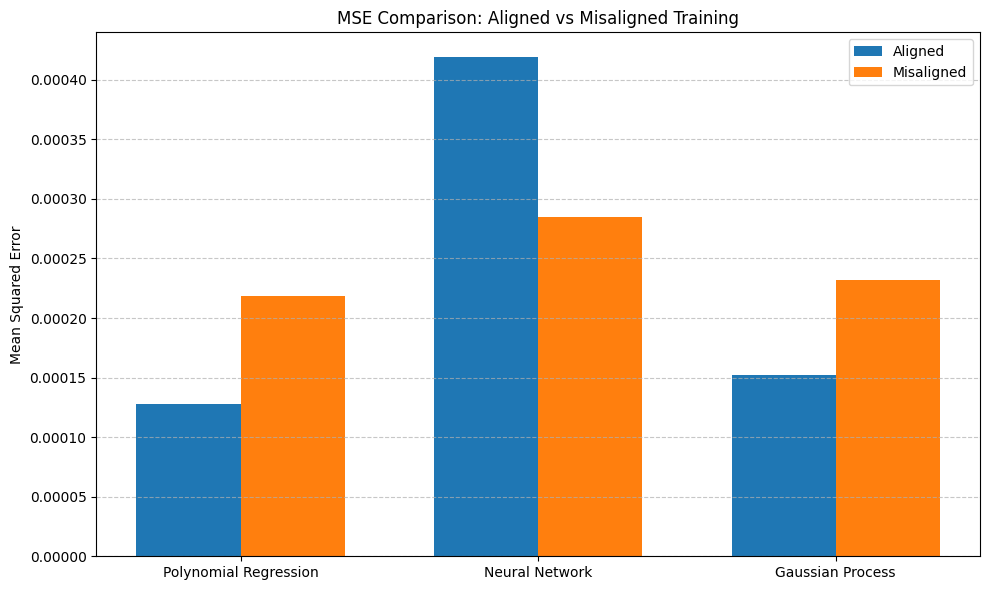

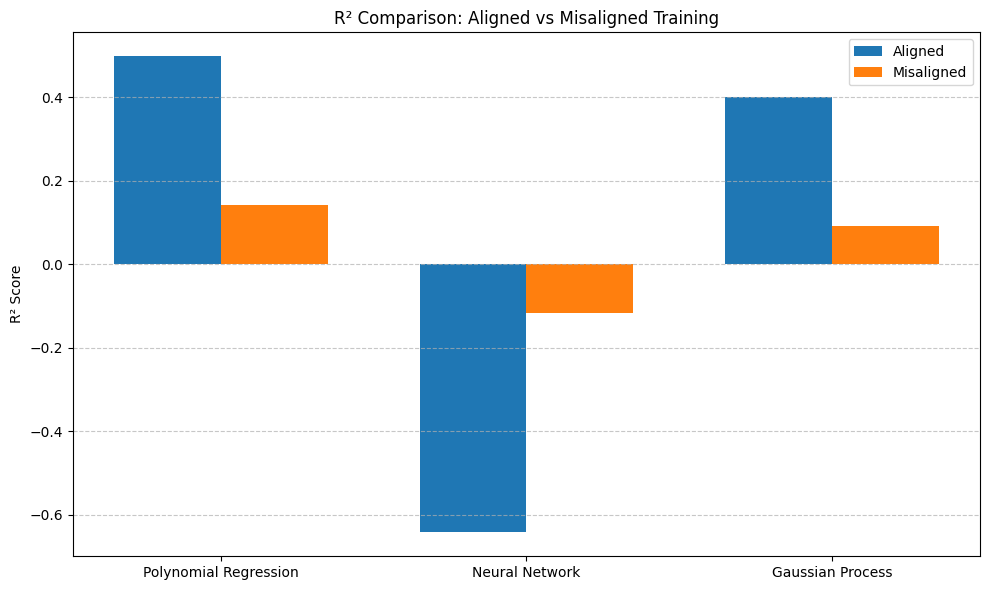

In [13]:
# Cell 5: Summary and Comparison of All Models
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Create summary dataframe
models = ['Polynomial Regression', 'Neural Network', 'Gaussian Process']
metrics = ['MSE', 'R²']

try:
    results = pd.DataFrame(index=pd.MultiIndex.from_product([models, ['Aligned', 'Misaligned']]),
                          columns=metrics)

    # Polynomial regression results
    results.loc[('Polynomial Regression', 'Aligned'), 'MSE'] = mse_align_poly = mean_squared_error(y_test, y_pred_poly_align)
    results.loc[('Polynomial Regression', 'Aligned'), 'R²'] = r2_score(y_test, y_pred_poly_align)
    results.loc[('Polynomial Regression', 'Misaligned'), 'MSE'] = mse_noalign_poly = mean_squared_error(y_test, y_pred_poly_noalign)
    results.loc[('Polynomial Regression', 'Misaligned'), 'R²'] = r2_score(y_test, y_pred_poly_noalign)

    # Neural network results
    results.loc[('Neural Network', 'Aligned'), 'MSE'] = mse_align_nn = mean_squared_error(y_test, y_pred_nn_align)
    results.loc[('Neural Network', 'Aligned'), 'R²'] = r2_score(y_test, y_pred_nn_align)
    results.loc[('Neural Network', 'Misaligned'), 'MSE'] = mse_noalign_nn = mean_squared_error(y_test, y_pred_nn_noalign)
    results.loc[('Neural Network', 'Misaligned'), 'R²'] = r2_score(y_test, y_pred_nn_noalign)

    # Gaussian process results
    results.loc[('Gaussian Process', 'Aligned'), 'MSE'] = mse_align_gp = mean_squared_error(y_test, y_pred_gp_align)
    results.loc[('Gaussian Process', 'Aligned'), 'R²'] = r2_score(y_test, y_pred_gp_align)
    results.loc[('Gaussian Process', 'Misaligned'), 'MSE'] = mse_noalign_gp = mean_squared_error(y_test, y_pred_gp_noalign)
    results.loc[('Gaussian Process', 'Misaligned'), 'R²'] = r2_score(y_test, y_pred_gp_noalign)

    print("Model Performance Summary:")
    print(results)

    # Calculate improvement from alignment
    improvement = pd.DataFrame(index=models, columns=['MSE Improvement %', 'R² Improvement %'])

    improvement.loc['Polynomial Regression', 'MSE Improvement %'] = 100 * (mse_noalign_poly - mse_align_poly) / mse_noalign_poly
    improvement.loc['Neural Network', 'MSE Improvement %'] = 100 * (mse_noalign_nn - mse_align_nn) / mse_noalign_nn
    improvement.loc['Gaussian Process', 'MSE Improvement %'] = 100 * (mse_noalign_gp - mse_align_gp) / mse_noalign_gp

    improvement.loc['Polynomial Regression', 'R² Improvement %'] = 100 * (results.loc[('Polynomial Regression', 'Aligned'), 'R²'] -
                                                                 results.loc[('Polynomial Regression', 'Misaligned'), 'R²']) / abs(results.loc[('Polynomial Regression', 'Misaligned'), 'R²'])
    improvement.loc['Neural Network', 'R² Improvement %'] = 100 * (results.loc[('Neural Network', 'Aligned'), 'R²'] -
                                                        results.loc[('Neural Network', 'Misaligned'), 'R²']) / abs(results.loc[('Neural Network', 'Misaligned'), 'R²'])
    improvement.loc['Gaussian Process', 'R² Improvement %'] = 100 * (results.loc[('Gaussian Process', 'Aligned'), 'R²'] -
                                                           results.loc[('Gaussian Process', 'Misaligned'), 'R²']) / abs(results.loc[('Gaussian Process', 'Misaligned'), 'R²'])

    print("\nImprovement from Alignment:")
    print(improvement)

    # Barplot of MSE for all models
    plt.figure(figsize=(10, 6))
    x = np.arange(len(models))
    width = 0.35

    aligned_mse = [results.loc[(model, 'Aligned'), 'MSE'] for model in models]
    misaligned_mse = [results.loc[(model, 'Misaligned'), 'MSE'] for model in models]

    plt.bar(x - width/2, aligned_mse, width, label='Aligned')
    plt.bar(x + width/2, misaligned_mse, width, label='Misaligned')

    plt.ylabel('Mean Squared Error')
    plt.title('MSE Comparison: Aligned vs Misaligned Training')
    plt.xticks(x, models)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Barplot of R² for all models
    plt.figure(figsize=(10, 6))

    aligned_r2 = [results.loc[(model, 'Aligned'), 'R²'] for model in models]
    misaligned_r2 = [results.loc[(model, 'Misaligned'), 'R²'] for model in models]

    plt.bar(x - width/2, aligned_r2, width, label='Aligned')
    plt.bar(x + width/2, misaligned_r2, width, label='Misaligned')

    plt.ylabel('R² Score')
    plt.title('R² Comparison: Aligned vs Misaligned Training')
    plt.xticks(x, models)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

except NameError:
    print("Error: Run all model cells first to calculate metrics for each model")